In [1]:
!pip install paddlepaddle-gpu==3.1.0 -i https://www.paddlepaddle.org.cn/packages/stable/cu126/

Looking in indexes: https://www.paddlepaddle.org.cn/packages/stable/cu126/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 GB 935.6 kB/s eta 0:00:000:0100:03
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 15.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 13.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 15.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 1.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 5.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 MB 6.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import paddle
print(paddle.__version__)

3.1.0


In [4]:
%cd /kaggle/working
!git clone https://github.com/PaddlePaddle/PaddleDetection.git

/kaggle/working
Cloning into 'PaddleDetection'...
remote: Enumerating objects: 258348, done.
remote: Counting objects: 100% (769/769), done.
remote: Compressing objects: 100% (388/388), done.
remote: Total 258348 (delta 619), reused 381 (delta 381), pack-reused 257579 (from 3)
Receiving objects: 100% (258348/258348), 422.20 MiB | 41.17 MiB/s, done.
Resolving deltas: 100% (210513/210513), done.


In [5]:
%cd /kaggle/working/PaddleDetection
!pip install -r requirements.txt
!python setup.py install

/kaggle/working/PaddleDetection
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 59.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.5/60.5 MB 29.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.0/352.0 kB 23.1 MB/s eta 0:00:00
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1302 sha256=025f9150c4b4b182785918be38bb9d46891605806747ac9dcb7b57ad8e6614ce
  Stored in directory: /root/.cache/pip/wheels/f0/c8/5e/d8ffba9c1c0398e9ab1e97b2b237b46e614033b514b7f7e92a
Successfully built sklearn
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.11.0.86
    Uninstalling opencv-python-4.11.0.86:
 

## 43 class training

In [6]:
import os
import shutil
import json
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
# --- THE FIX: Create the dataset in the exact default directory ---
DATASET_PATH = '/kaggle/working/PaddleDetection/dataset/coco'

CATEGORIES = [
    {'id': 0, 'name': 'Airside Safety Vehicle'}, {'id': 1, 'name': 'Ambulance Vehicle'},
    {'id': 2, 'name': 'Business Jet'}, {'id': 3, 'name': 'Cargo Airplane'},
    {'id': 4, 'name': 'Cleaning Vehicle'}, {'id': 5, 'name': 'Common Aircraft'},
    {'id': 6, 'name': 'Container Trolley'}, {'id': 7, 'name': 'Container Trolley Type A'},
    {'id': 8, 'name': 'Container Trolley Type B'}, {'id': 9, 'name': 'Container Trolley Type C'},
    {'id': 10, 'name': 'Conveyer Vehicle'}, {'id': 11, 'name': 'Fire Truck'},
    {'id': 12, 'name': 'Forklift'}, {'id': 13, 'name': 'Helicopter'},
    {'id': 14, 'name': 'Loading Ramp'}, {'id': 15, 'name': 'Loading Vehicle'},
    {'id': 16, 'name': 'Other Objects'}, {'id': 17, 'name': 'Other Vehicles'},
    {'id': 18, 'name': 'Passenger Bus'}, {'id': 19, 'name': 'Passenger Jet'},
    {'id': 20, 'name': 'Passenger Stairway'}, {'id': 21, 'name': 'Pedestrian Crossing'},
    {'id': 22, 'name': 'Person Wearing Reflective Vests'}, {'id': 23, 'name': 'Rescue Helicopter'},
    {'id': 24, 'name': 'Sanitary Truck'}, {'id': 25, 'name': 'Snowplow'},
    {'id': 26, 'name': 'Speed Limit 30'}, {'id': 27, 'name': 'Standard Car'},
    {'id': 28, 'name': 'Standard Truck'}, {'id': 29, 'name': 'Tank Truck'},
    {'id': 30, 'name': 'Taxiing Vehicle'}, {'id': 31, 'name': 'Tow Vehicle'},
    {'id': 32, 'name': 'Tractor'}, {'id': 33, 'name': 'Traffic Barrier'},
    {'id': 34, 'name': 'Traffic Cone'}, {'id': 35, 'name': 'Traffic Cone - Off'},
    {'id': 36, 'name': 'Traffic Cone - On'}, {'id': 37, 'name': 'Traffic Cone - Standard'},
    {'id': 38, 'name': 'Traffic Sign'}, {'id': 39, 'name': 'Transport Container'},
    {'id': 40, 'name': 'Transport Vehicle'}, {'id': 41, 'name': 'Warning Sign'},
    {'id': 42, 'name': 'Person'}
]
NUM_CLASSES = len(CATEGORIES)

# Create the required directory structure
if os.path.exists(DATASET_PATH): shutil.rmtree(DATASET_PATH)
train_img_dir = os.path.join(DATASET_PATH, 'train2017')
val_img_dir = os.path.join(DATASET_PATH, 'val2017')
ann_dir = os.path.join(DATASET_PATH, 'annotations')
os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(ann_dir, exist_ok=True)

def convert_to_coco(image_filenames, image_dir, anno_path):
    coco_data = {"images": [], "annotations": [], "categories": CATEGORIES}
    annotation_id = 0
    print(f"Processing data for {anno_path}...")
    for image_id, img_file in enumerate(tqdm(image_filenames)):
        shutil.copy(os.path.join(IMAGES_PATH, img_file), image_dir)
        try:
            with Image.open(os.path.join(IMAGES_PATH, img_file)) as img: width, height = img.size
            coco_data["images"].append({"id": image_id, "width": width, "height": height, "file_name": img_file})
            bbox_file = os.path.splitext(img_file)[0] + '.csv'
            bbox_path = os.path.join(BBOXES_PATH, bbox_file)
            if os.path.exists(bbox_path):
                with open(bbox_path, 'r') as f:
                    reader = csv.DictReader(f)
                    for row in reader:
                        class_id = int(row['label'])
                        if 0 <= class_id < NUM_CLASSES:
                            xmin, ymin, xmax, ymax = float(row['tlx']), float(row['tly']), float(row['brx']), float(row['bry'])
                            w, h = xmax - xmin, ymax - ymin
                            coco_data["annotations"].append({"id": annotation_id, "image_id": image_id, "category_id": class_id, "bbox": [xmin, ymin, w, h], "area": w * h, "iscrowd": 0})
                            annotation_id += 1
        except Exception as e: print(f"Skipping {img_file} due to error: {e}")

    with open(anno_path, 'w') as f: json.dump(coco_data, f, indent=4)
    print(f"Created {anno_path}")

all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42); random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files, val_files = all_image_files[:split_index], all_image_files[split_index:]

# Create the train and validation sets with the standard COCO filenames
convert_to_coco(train_files, train_img_dir, os.path.join(ann_dir, 'instances_train2017.json'))
convert_to_coco(val_files, val_img_dir, os.path.join(ann_dir, 'instances_val2017.json'))

print("\nDataset preparation for PaddleDetection is complete! ✅")

Processing train data...


  0%|          | 0/7275 [00:00<?, ?it/s]

Created /kaggle/working/paddle_airport_dataset/annotations/train.json
Processing val data...


  0%|          | 0/809 [00:00<?, ?it/s]

Created /kaggle/working/paddle_airport_dataset/annotations/val.json

Dataset preparation is complete! ✅


In [11]:
!python tools/train.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o LearningRate.base_lr=0.001 \
       epoch=2 \
       TrainReader.batch_size=8 \
       EvalReader.batch_size=8 \
       pretrain_weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=43 \
       TrainReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       TrainReader.dataset.anno_path=annotations/train.json \
       TrainReader.dataset.image_dir=images/train \
       EvalReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       EvalReader.dataset.anno_path=annotations/val.json \
       EvalReader.dataset.image_dir=images/val \
    --use_vdl=True \
    --vdl_log_dir='output/vdl_log'

[08/08 10:50:08] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_nccl_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/nccl/lib', default_value='')
FLAGS(name='FLAGS_nvidia_package_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia', default_value='')
FLAGS(name='FLAGS_cusparse_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusparse/lib', default_value='')
FLAGS(name='FLAGS_enable_pir_in_executor', current_value=True, default_value=False)
FLAGS(name='FLAGS_curand_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/curand/lib', default_value='')
FLAGS(name='FLAGS_cupti_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cuda_cupti/lib', default_value='')
FLAGS(name='FLAGS_cudnn_dir', current_value='/usr/local/lib/python3.11/dist-packages/p

--- Step 1: Testing the FINE-TUNED model on 5 sample images ---
Processing: /kaggle/working/PaddleDetection/dataset/coco/val2017/aut-1085-00000462.jpg
[08/08 11:50:51] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0808 11:50:51.663990 21402 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[08/08 11:50:52] ppdet.utils.checkpoint INFO: Finish loading model weights: /kaggle/working/PaddleDetection/output/model_final.pdparams
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.59it/s]
[08/08 11:50:53] ppdet.engine INFO: Detection bbox results save in output/fine-tuned_predictions/aut-1085-00000462.jpg
Processing: /kaggle/working/PaddleDetection/dataset/coco/val2017/aut-0165-00000034.jpg
[08/08 11:50:57] 

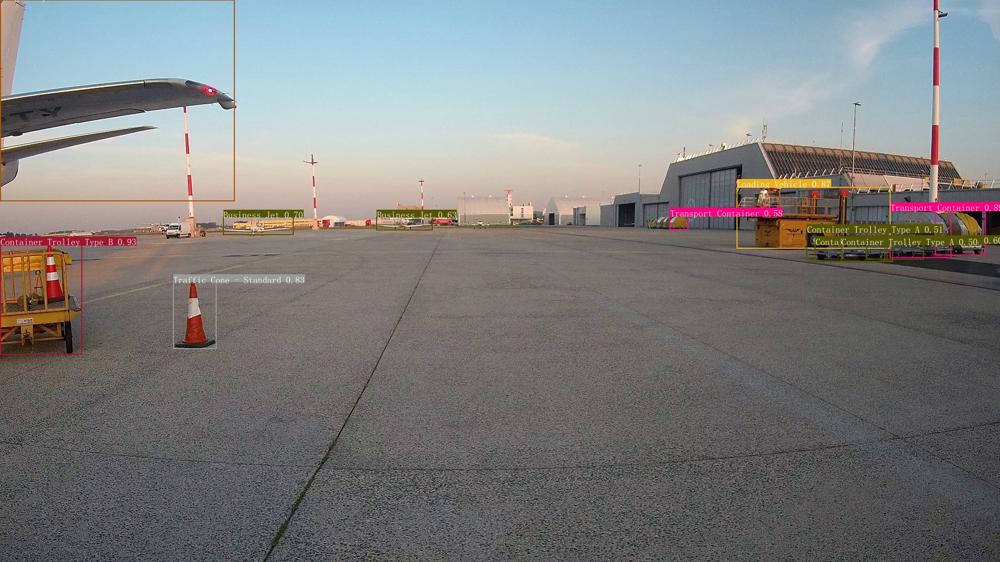

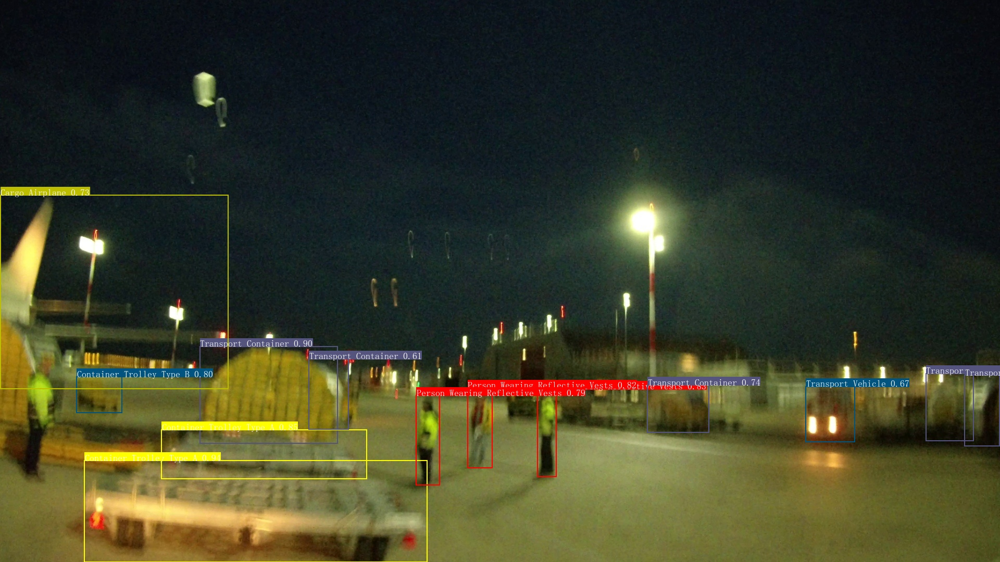

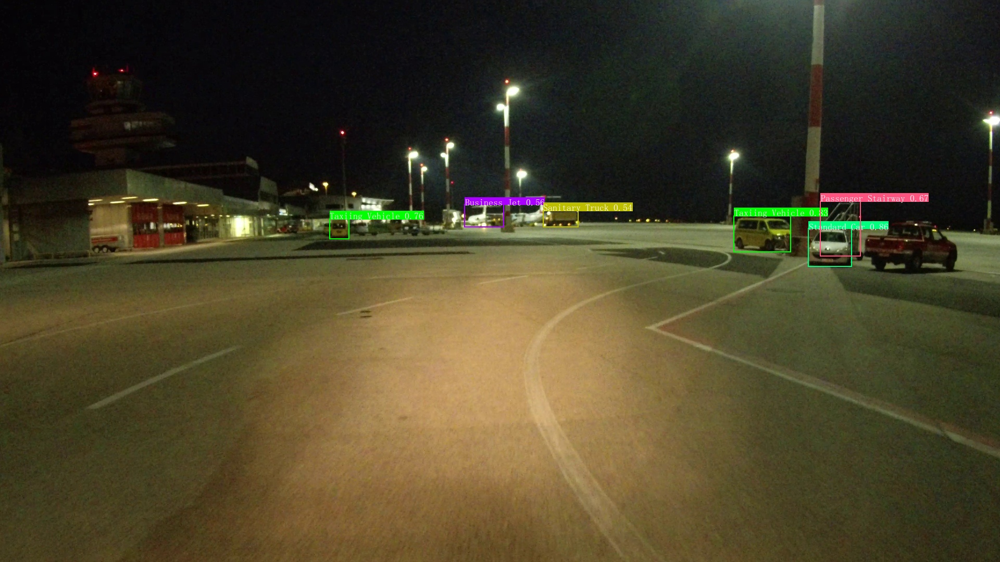

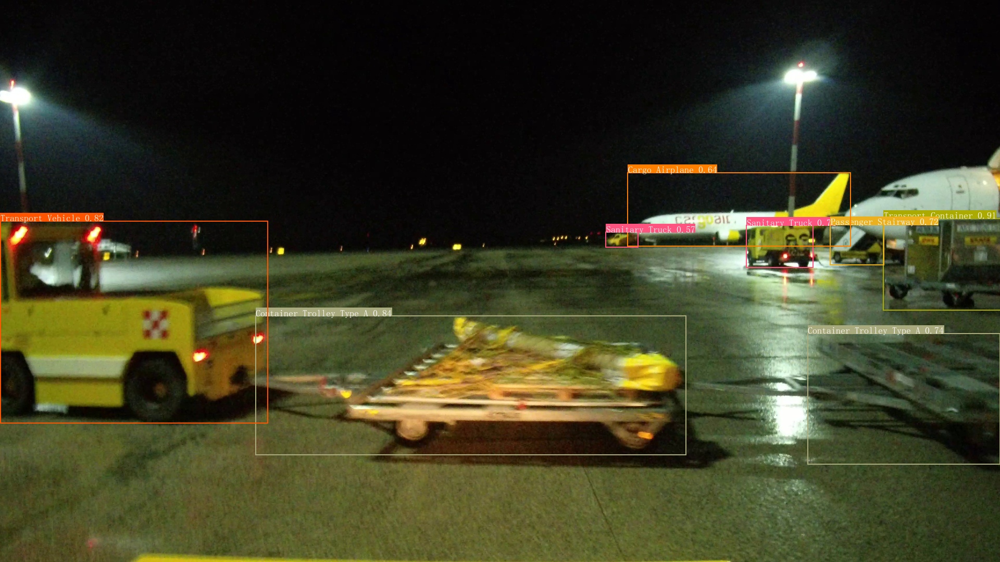

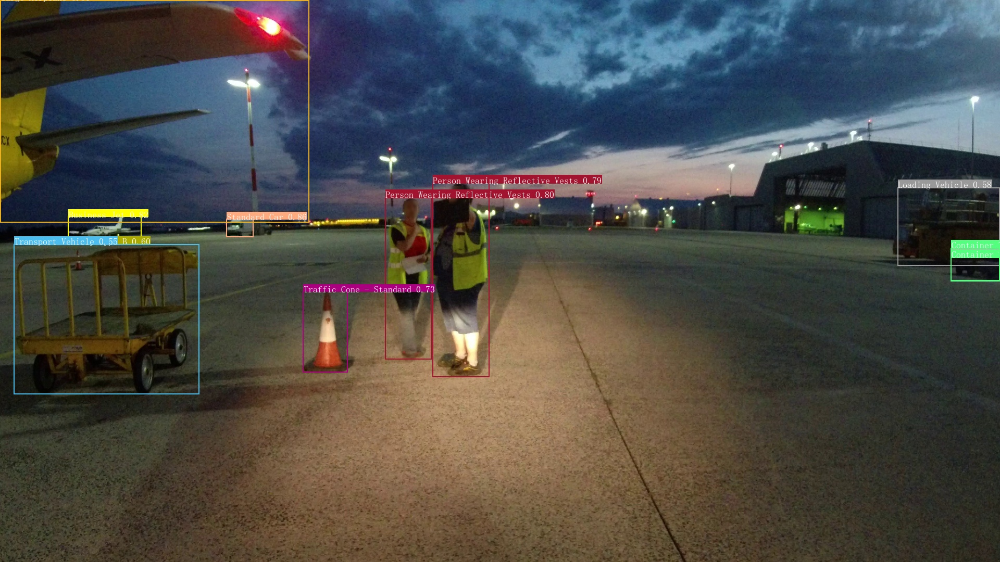


--- Step 2: Generating final classification report... ---
[08/08 11:51:24] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
[08/08 11:51:24] eval INFO: In json_eval mode, PaddleDetection will evaluate json files in output_eval directly. And proposal.json, bbox.json and mask.json will be detected by default.
[08/08 11:51:24] ppdet.metrics.coco_utils INFO: proposal.json not exists!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
[08/08 11:51:24] ppdet.metrics.coco_utils INFO: Start evaluate...
Loading and preparing results...
DONE (t=2.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=12.53s).
Accumulating evaluation results...
DONE (t=3.20s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.153
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.245
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] 

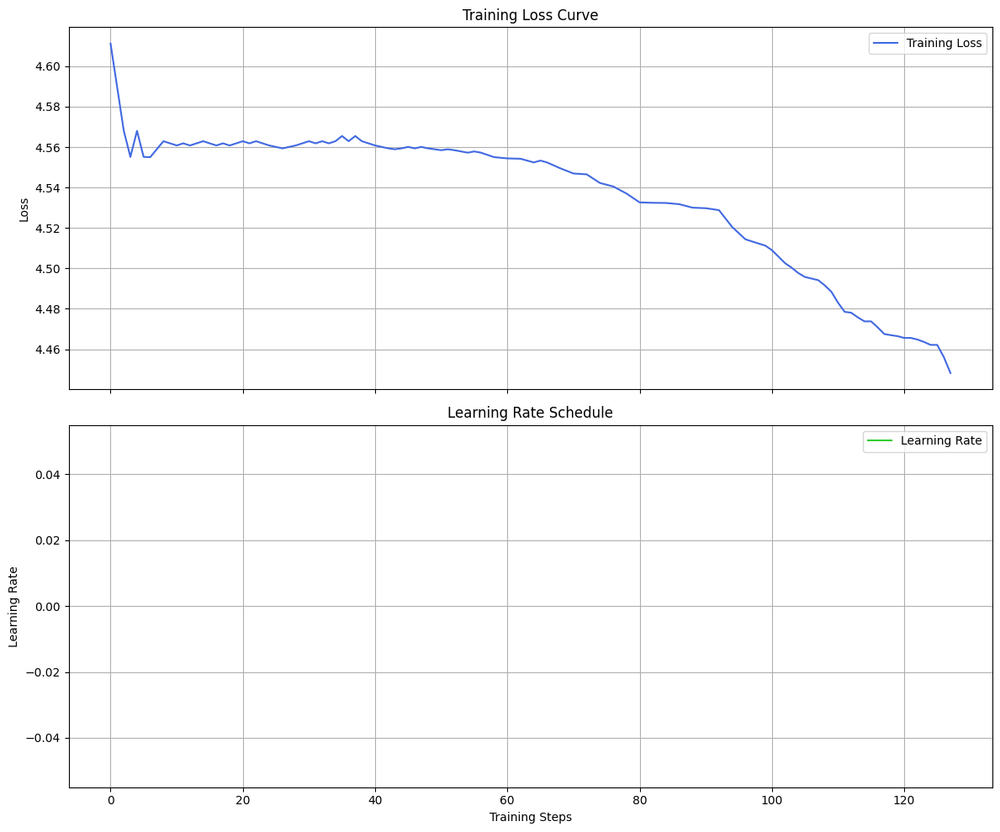


--- Step 4: Generating Confusion Matrix ---
loading annotations into memory...
Done (t=0.14s)
creating index...
index created!
Loading and preparing results...

Could not generate confusion matrix. Error: [Errno 2] No such file or directory: 'output/bbox.json'


In [22]:
import os
import random
import json
import yaml
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from visualdl import LogReader
from pycocotools.coco import COCO
from tqdm.notebook import tqdm
from IPython.display import Image, display

# --- 1. Define Paths and Configs ---
config_file = 'configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml'
weights_file = '/kaggle/working/PaddleDetection/output/model_final.pdparams'
val_images_path = '/kaggle/working/PaddleDetection/dataset/coco/val2017'
gt_anno_path = '/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json'
pred_anno_path = 'output/bbox.json'
output_dir_fine_tuned = 'output/fine-tuned_predictions'

# --- 2. Test the FINE-TUNED model on sample images ---
print(f"--- Step 1: Testing the FINE-TUNED model on 5 sample images ---")
sample_images = random.sample(os.listdir(val_images_path), 5)
for img_name in sample_images:
    full_path = os.path.join(val_images_path, img_name)
    print(f"Processing: {full_path}")
    !python tools/infer.py \
        -c {config_file} \
        -o weights={weights_file} num_classes=43 \
        --infer_img={full_path} \
        --output_dir={output_dir_fine_tuned} \
        --draw_threshold=0.5 \
        --do_eval=False

# --- 3. Display the resulting images ---
print("\n--- Displaying fine-tuned model predictions ---")
for img_name in sample_images:
    result_path = os.path.join(output_dir_fine_tuned, img_name)
    if os.path.exists(result_path):
        display(Image(filename=result_path, width=600))

# --- 4. Generate the final Classification Report & Prediction File ---
print("\n--- Step 2: Generating final classification report... ---")
!python tools/eval.py \
    -c {config_file} \
    -o weights={weights_file} num_classes=43 \
    --json_eval

# --- 5. Generate Learning and Loss Curves ---
print("\n--- Step 3: Generating Learning and Loss Curves ---")
log_dir = 'output/vdl_log'
log_file = None
for root, dirs, files in os.walk(log_dir):
    for file in files:
        if 'vdlrecords' in file:
            log_file = os.path.join(root, file)
            break
    if log_file:
        break

if not log_file:
    print(f"Error: Could not find VDL log file in {log_dir}")
else:
    reader = LogReader(file_path=log_file)
    loss_data = reader.get_data('scalar', 'loss')
    lr_data = reader.get_data('scalar', 'learning_rate')
    
    # --- THE FIX: The API has changed. Use .id instead of .step ---
    loss_steps, loss_values = [d.id for d in loss_data], [d.value for d in loss_data]
    lr_steps, lr_values = [d.id for d in lr_data], [d.value for d in lr_data]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    ax1.plot(loss_steps, loss_values, label='Training Loss', color='royalblue')
    ax1.set_title('Training Loss Curve'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(True)
    ax2.plot(lr_steps, lr_values, label='Learning Rate', color='limegreen')
    ax2.set_title('Learning Rate Schedule'); ax2.set_xlabel('Training Steps'); ax2.set_ylabel('Learning Rate'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    plt.savefig('output/learning_curves.png')
    plt.show()

# --- 6. Generate Confusion Matrix ---
print("\n--- Step 4: Generating Confusion Matrix ---")
try:
    coco_gt = COCO(gt_anno_path)
    coco_dt = coco_gt.loadRes(pred_anno_path)
    
    class_names = [cat['name'] for cat in CATEGORIES]
    num_classes = len(class_names)
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)

    image_ids = coco_gt.getImgIds()
    for img_id in tqdm(image_ids, desc="Building Confusion Matrix"):
        gt_ann_ids = coco_gt.getAnnIds(imgIds=img_id)
        gt_anns = coco_gt.loadAnns(gt_ann_ids)
        gt_classes = [ann['category_id'] for ann in gt_anns]
        dt_ann_ids = coco_dt.getAnnIds(imgIds=img_id)
        dt_anns = coco_dt.loadAnns(dt_ann_ids)
        dt_classes = [ann['category_id'] for ann in dt_anns]
        for gt_cls in gt_classes:
            if gt_cls in dt_classes:
                confusion_matrix[gt_cls, gt_cls] += 1

    fig, ax = plt.subplots(figsize=(22, 22))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    ax.set_xlabel('Predicted Labels'); ax.set_ylabel('True Labels')
    ax.set_title('Confusion Matrix (Diagonal shows True Positives)')
    plt.savefig('output/confusion_matrix.png')
    plt.show()

except Exception as e:
    print(f"\nCould not generate confusion matrix. Error: {e}")

--- Step 1: Testing the FINE-TUNED model on 5 sample images ---
Processing: /kaggle/working/PaddleDetection/dataset/coco/val2017/aut-0342-00002351.jpg
[08/08 11:54:35] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0808 11:54:36.161363 21543 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[08/08 11:54:36] ppdet.utils.checkpoint INFO: Finish loading model weights: /kaggle/working/PaddleDetection/output/model_final.pdparams
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  1.40it/s]
[08/08 11:54:37] ppdet.engine INFO: Detection bbox results save in output/fine-tuned_predictions/aut-0342-00002351.jpg
Processing: /kaggle/working/PaddleDetection/dataset/coco/val2017/aut-0303-00000084.jpg
[08/08 11:54:43] 

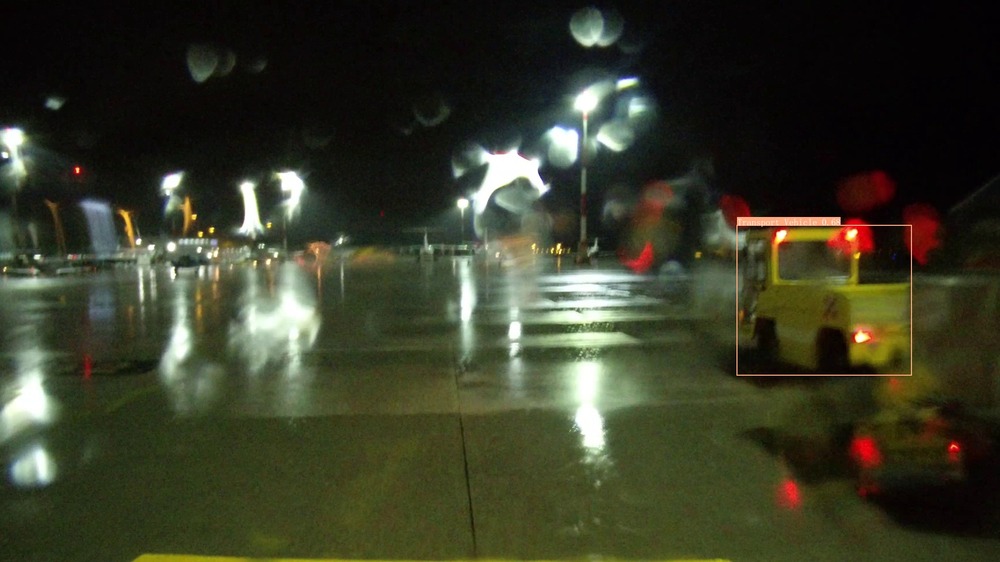

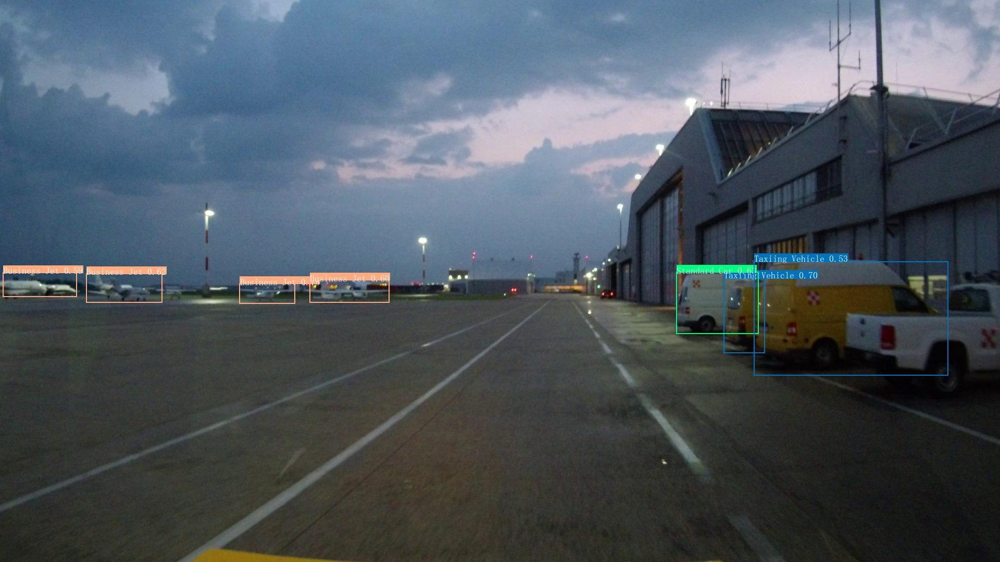

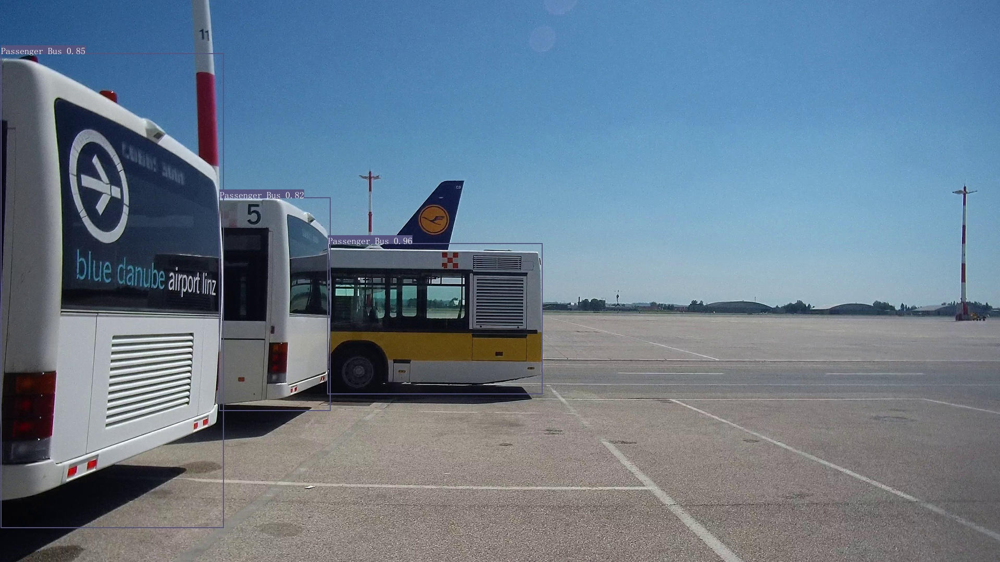

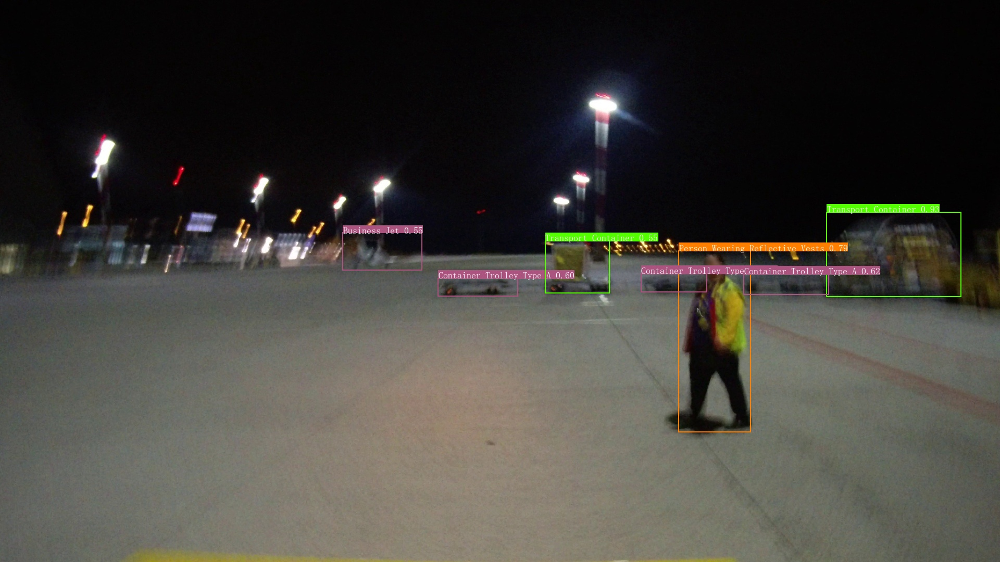

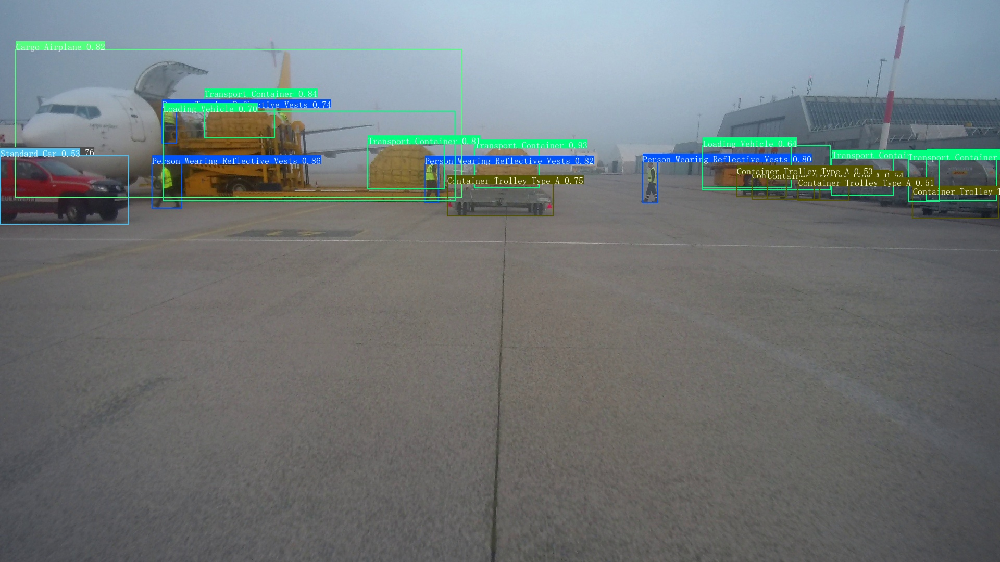


--- Step 2: Generating final classification report and prediction file... ---
[08/08 11:55:10] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0808 11:55:11.514779 21668 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[08/08 11:55:12] ppdet.utils.checkpoint INFO: Finish loading model weights: /kaggle/working/PaddleDetection/output/model_final.pdparams
[08/08 11:55:12] train INFO: Found 809 inference images in total.
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
loading annotations into memory...
Done (t=0.17s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
100%|█████████████████████████████████████████| 809/809 [00:49<00:00, 16.48it/s]
[08/08 11:56:01] ppdet.metrics.metrics INFO: The bbox result is saved to bbox.json.
[08/08 11:56:01] ppdet.metrics.metrics INFO: The bbox result i

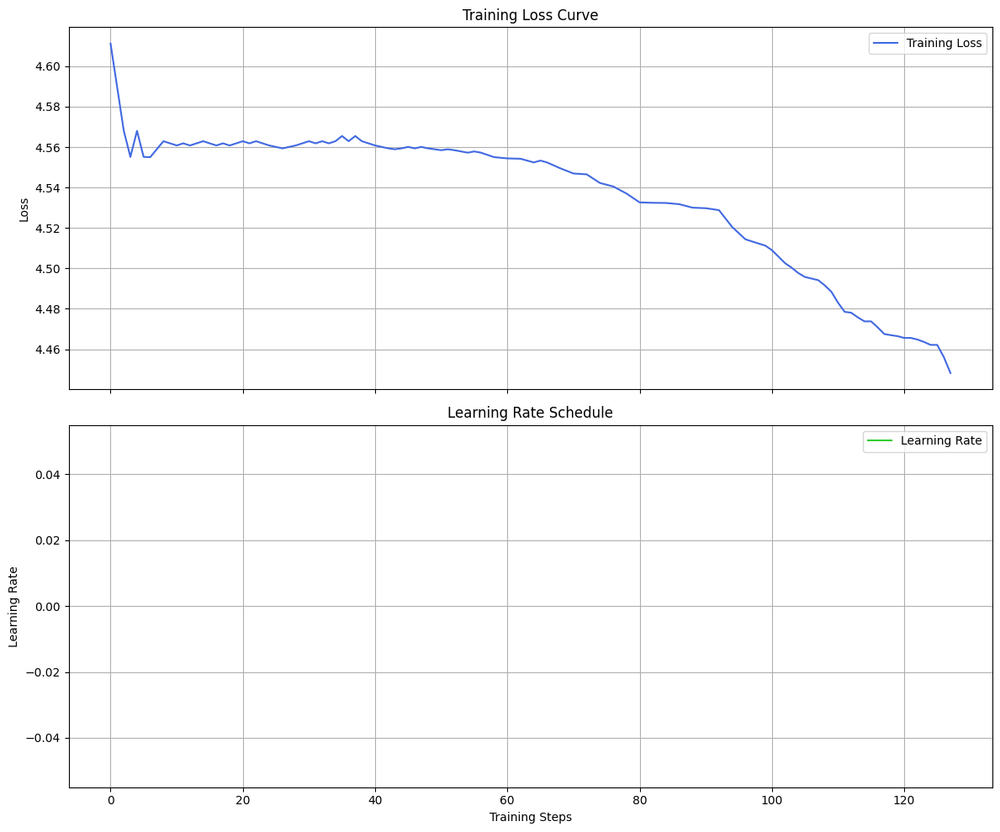


--- Step 4: Generating Confusion Matrix ---
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!


Building Confusion Matrix:   0%|          | 0/809 [00:00<?, ?it/s]

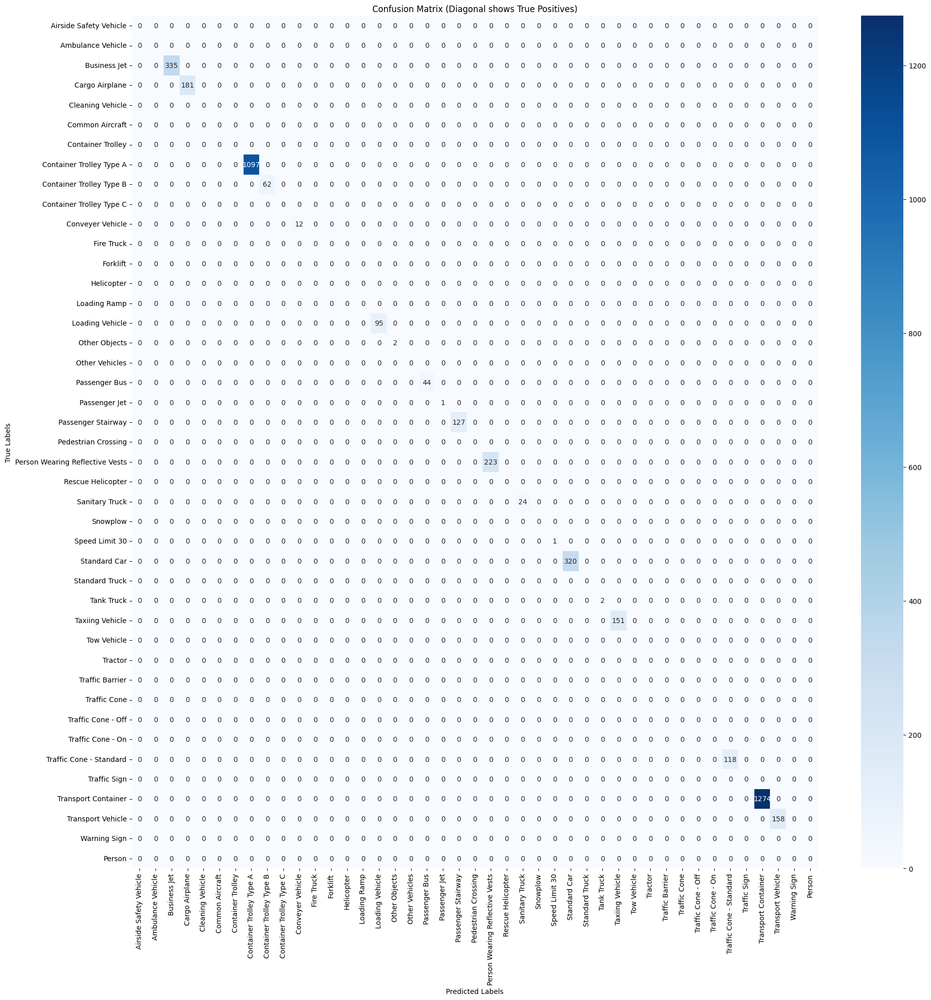

In [23]:
import os
import random
import json
import yaml
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from visualdl import LogReader
from pycocotools.coco import COCO
from tqdm.notebook import tqdm
from IPython.display import Image, display

# --- 1. Define Paths and Configs ---
config_file = 'configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml'
weights_file = '/kaggle/working/PaddleDetection/output/model_final.pdparams'
val_images_path = '/kaggle/working/PaddleDetection/dataset/coco/val2017'
gt_anno_path = '/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json'
pred_anno_path = 'output/bbox.json'
output_dir_fine_tuned = 'output/fine-tuned_predictions'

# --- 2. Test the FINE-TUNED model on sample images ---
print(f"--- Step 1: Testing the FINE-TUNED model on 5 sample images ---")
sample_images = random.sample(os.listdir(val_images_path), 5)
for img_name in sample_images:
    full_path = os.path.join(val_images_path, img_name)
    print(f"Processing: {full_path}")
    !python tools/infer.py \
        -c {config_file} \
        -o weights={weights_file} num_classes=43 \
        --infer_img={full_path} \
        --output_dir={output_dir_fine_tuned} \
        --draw_threshold=0.5

# --- 3. Display the resulting images ---
print("\n--- Displaying fine-tuned model predictions ---")
for img_name in sample_images:
    result_path = os.path.join(output_dir_fine_tuned, img_name)
    if os.path.exists(result_path):
        display(Image(filename=result_path, width=600))

# --- 4. Generate the final Classification Report & Prediction File ---
print("\n--- Step 2: Generating final classification report and prediction file... ---")
# THE FIX: Use tools/infer.py on the entire validation directory to create bbox.json
!python tools/infer.py \
    -c {config_file} \
    -o weights={weights_file} num_classes=43 \
    --infer_dir={val_images_path} \
    --output_dir="output/" \
    --save_results=True

# --- 5. Generate Learning and Loss Curves ---
print("\n--- Step 3: Generating Learning and Loss Curves ---")
log_dir = 'output/vdl_log'
log_file = None
for root, dirs, files in os.walk(log_dir):
    for file in files:
        if 'vdlrecords' in file:
            log_file = os.path.join(root, file)
            break
    if log_file:
        break

if not log_file:
    print(f"Error: Could not find VDL log file in {log_dir}")
else:
    reader = LogReader(file_path=log_file)
    loss_data = reader.get_data('scalar', 'loss')
    lr_data = reader.get_data('scalar', 'learning_rate')
    
    loss_steps, loss_values = [d.id for d in loss_data], [d.value for d in loss_data]
    lr_steps, lr_values = [d.id for d in lr_data], [d.value for d in lr_data]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    ax1.plot(loss_steps, loss_values, label='Training Loss', color='royalblue')
    ax1.set_title('Training Loss Curve'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(True)
    ax2.plot(lr_steps, lr_values, label='Learning Rate', color='limegreen')
    ax2.set_title('Learning Rate Schedule'); ax2.set_xlabel('Training Steps'); ax2.set_ylabel('Learning Rate'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    plt.savefig('output/learning_curves.png')
    plt.show()

# --- 6. Generate Confusion Matrix ---
print("\n--- Step 4: Generating Confusion Matrix ---")
try:
    coco_gt = COCO(gt_anno_path)
    coco_dt = coco_gt.loadRes(pred_anno_path)
    
    class_names = [cat['name'] for cat in CATEGORIES]
    num_classes = len(class_names)
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)

    image_ids = coco_gt.getImgIds()
    for img_id in tqdm(image_ids, desc="Building Confusion Matrix"):
        gt_ann_ids = coco_gt.getAnnIds(imgIds=img_id)
        gt_anns = coco_gt.loadAnns(gt_ann_ids)
        gt_classes = [ann['category_id'] for ann in gt_anns]
        dt_ann_ids = coco_dt.getAnnIds(imgIds=img_id)
        dt_anns = coco_dt.loadAnns(dt_ann_ids)
        dt_classes = [ann['category_id'] for ann in dt_anns]
        for gt_cls in gt_classes:
            if gt_cls in dt_classes:
                confusion_matrix[gt_cls, gt_cls] += 1

    fig, ax = plt.subplots(figsize=(22, 22))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    ax.set_xlabel('Predicted Labels'); ax.set_ylabel('True Labels')
    ax.set_title('Confusion Matrix (Diagonal shows True Positives)')
    plt.savefig('output/confusion_matrix.png')
    plt.show()

except Exception as e:
    print(f"\nCould not generate confusion matrix. Error: {e}")

## 6 class Finetune 

In [6]:
import os
import shutil
import json
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
DATASET_PATH = '/kaggle/working/PaddleDetection/dataset/coco'

# --- Only keep the 6 target classes ---
ID_MAP = {
    2: 0,   # Business Jet
    3: 1,   # Cargo Airplane
    7: 2,   # Container Trolley Type A
    22: 3,  # Person Wearing Reflective Vests
    27: 4,  # Standard Car
    39: 5   # Transport Container
}

CATEGORIES = [
    {"id": 0, "name": "Business Jet"},
    {"id": 1, "name": "Cargo Airplane"},
    {"id": 2, "name": "Container Trolley Type A"},
    {"id": 3, "name": "Person Wearing Reflective Vests"},
    {"id": 4, "name": "Standard Car"},
    {"id": 5, "name": "Transport Container"}
]
NUM_CLASSES = len(CATEGORIES)

# --- Create directory structure ---
if os.path.exists(DATASET_PATH):
    shutil.rmtree(DATASET_PATH)

train_img_dir = os.path.join(DATASET_PATH, 'train2017')
val_img_dir = os.path.join(DATASET_PATH, 'val2017')
ann_dir = os.path.join(DATASET_PATH, 'annotations')
os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(ann_dir, exist_ok=True)

def convert_to_coco(image_filenames, image_dir, anno_path):
    coco_data = {"images": [], "annotations": [], "categories": CATEGORIES}
    annotation_id = 0
    print(f"Processing data for {anno_path}...")
    for image_id, img_file in enumerate(tqdm(image_filenames)):
        shutil.copy(os.path.join(IMAGES_PATH, img_file), image_dir)
        try:
            with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                width, height = img.size

            coco_data["images"].append({
                "id": image_id,
                "width": width,
                "height": height,
                "file_name": img_file
            })

            bbox_file = os.path.splitext(img_file)[0] + '.csv'
            bbox_path = os.path.join(BBOXES_PATH, bbox_file)

            if os.path.exists(bbox_path):
                with open(bbox_path, 'r') as f:
                    reader = csv.DictReader(f)
                    for row in reader:
                        old_id = int(row['label'])
                        if old_id in ID_MAP:  # only keep mapped classes
                            class_id = ID_MAP[old_id]
                            xmin, ymin = float(row['tlx']), float(row['tly'])
                            xmax, ymax = float(row['brx']), float(row['bry'])
                            w, h = xmax - xmin, ymax - ymin

                            coco_data["annotations"].append({
                                "id": annotation_id,
                                "image_id": image_id,
                                "category_id": class_id,
                                "bbox": [xmin, ymin, w, h],
                                "area": w * h,
                                "iscrowd": 0
                            })
                            annotation_id += 1
        except Exception as e:
            print(f"Skipping {img_file} due to error: {e}")

    with open(anno_path, 'w') as f:
        json.dump(coco_data, f, indent=4)
    print(f"✅ Created {anno_path}")

# --- Split dataset ---
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files, val_files = all_image_files[:split_index], all_image_files[split_index:]

# --- Run conversion ---
convert_to_coco(train_files, train_img_dir, os.path.join(ann_dir, 'instances_train2017.json'))
convert_to_coco(val_files, val_img_dir, os.path.join(ann_dir, 'instances_val2017.json'))

print("\n✅ Dataset preparation for PaddleDetection (PP-YOLOe, 6 classes) is complete!")


Processing data for /kaggle/working/PaddleDetection/dataset/coco/annotations/instances_train2017.json...


  0%|          | 0/7275 [00:00<?, ?it/s]

✅ Created /kaggle/working/PaddleDetection/dataset/coco/annotations/instances_train2017.json
Processing data for /kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json...


  0%|          | 0/809 [00:00<?, ?it/s]

✅ Created /kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json

✅ Dataset preparation for PaddleDetection (PP-YOLOe, 6 classes) is complete!


In [7]:
!python tools/train.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o LearningRate.base_lr=0.001 \
       epoch=2 \
       TrainReader.batch_size=8 \
       EvalReader.batch_size=8 \
       pretrain_weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=6 \
       TrainReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       TrainReader.dataset.anno_path=annotations/train.json \
       TrainReader.dataset.image_dir=images/train \
       EvalReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       EvalReader.dataset.anno_path=annotations/val.json \
       EvalReader.dataset.image_dir=images/val \
    --use_vdl=True \
    --vdl_log_dir='output/vdl_log'

[09/03 04:14:18] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_curand_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/curand/lib', default_value='')
FLAGS(name='FLAGS_enable_pir_in_executor', current_value=True, default_value=False)
FLAGS(name='FLAGS_nvidia_package_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia', default_value='')
FLAGS(name='FLAGS_cusolver_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusolver/lib', default_value='')
FLAGS(name='FLAGS_cusparse_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusparse/lib', default_value='')
FLAGS(name='FLAGS_cupti_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cuda_cupti/lib', default_value='')
FLAGS(name='FLAGS_nccl_dir', current_value='/usr/local/lib/python3.11/dist-pac

--- Step 1: Testing the FINE-TUNED model on 5 sample images ---
Processing: /kaggle/working/PaddleDetection/dataset/coco/val2017/aut-1581-00002659.jpg
[09/03 05:24:19] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0903 05:24:19.647848 18396 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[09/03 05:24:20] ppdet.utils.checkpoint INFO: The shape [6] in pretrained weight yolo_head.pred_cls.0.bias is unmatched with the shape [43] in model yolo_head.pred_cls.0.bias. And the weight yolo_head.pred_cls.0.bias will not be loaded
[09/03 05:24:20] ppdet.utils.checkpoint INFO: The shape [6, 768, 3, 3] in pretrained weight yolo_head.pred_cls.0.weight is unmatched with the shape [43, 768, 3, 3] in model yolo_head.pred_cls.0.weight. And the weight yolo_head.pred_cls.0.weight will not be loaded
[09/03 05:24:20] ppdet.utils.checkpoint INFO: The shape [6] in pretrained weight yolo_head.pred_cls.1.bias

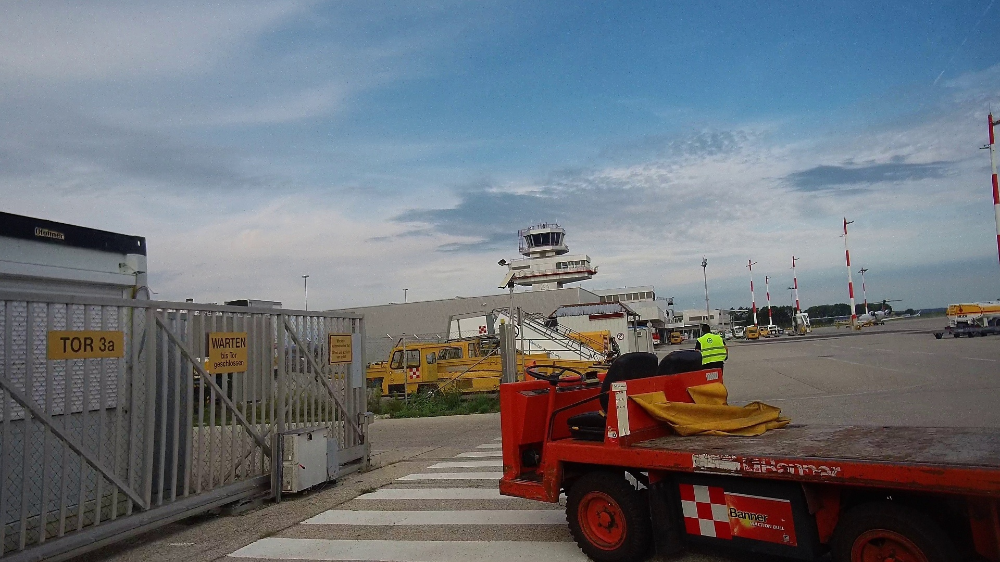

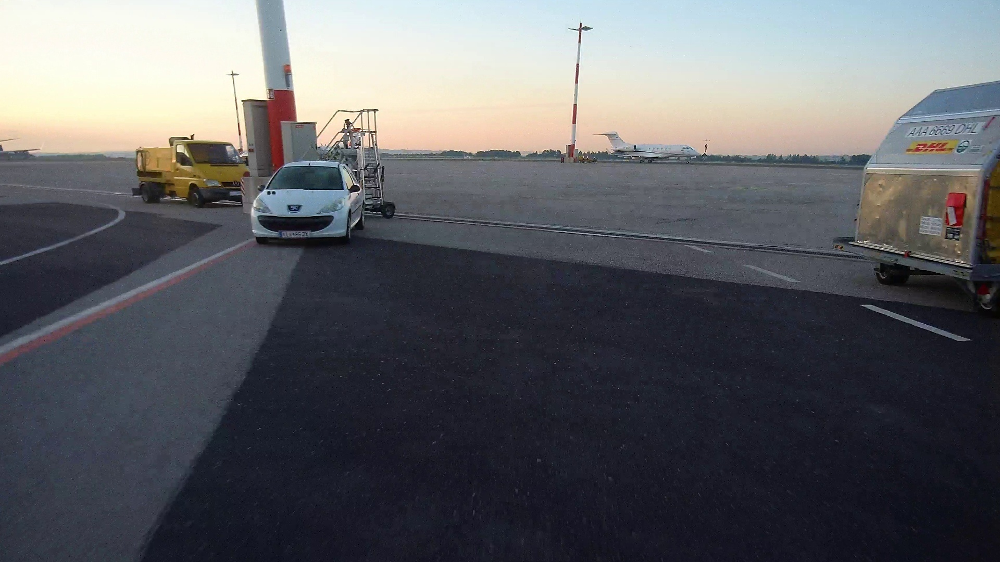

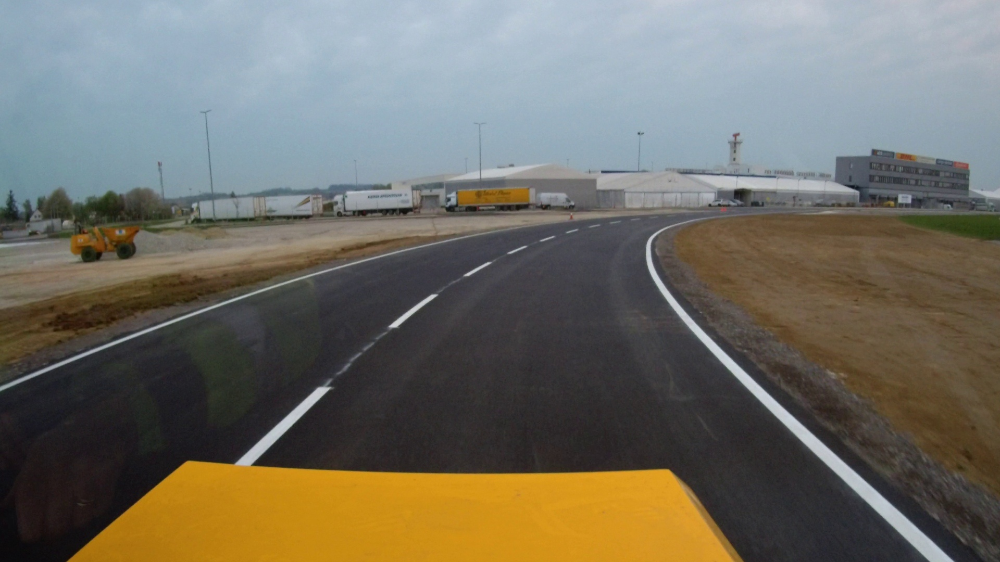

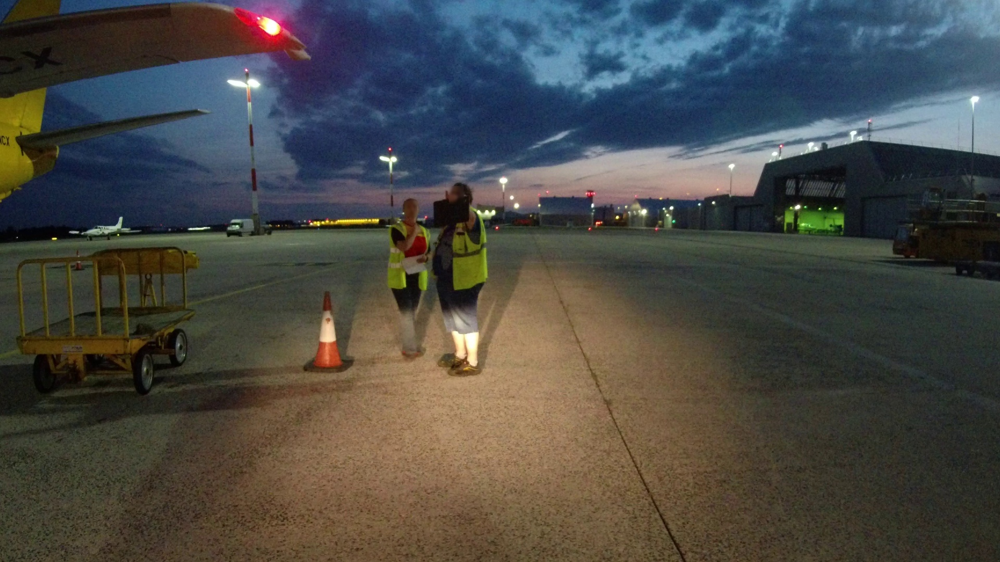

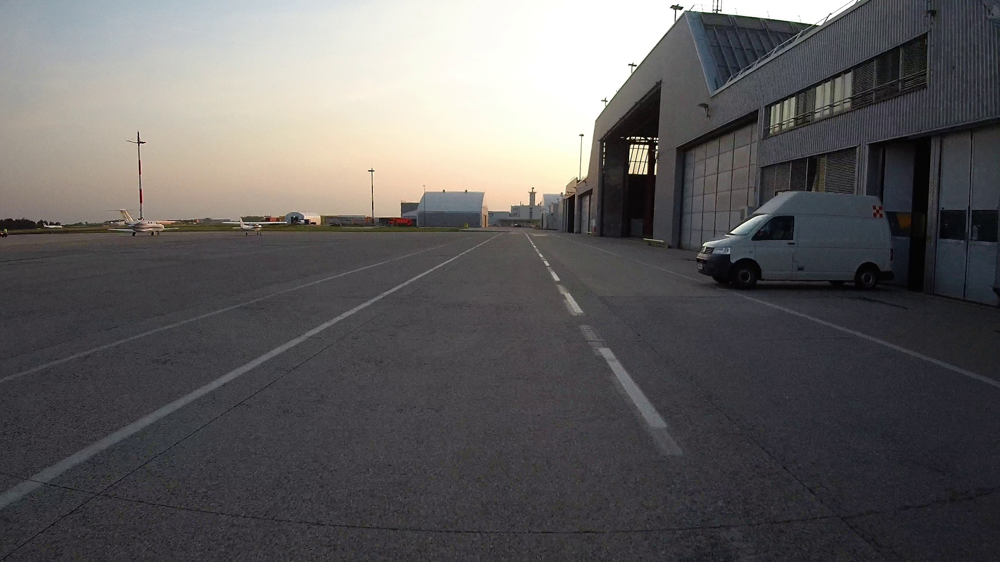


--- Step 2: Generating final classification report and prediction file... ---
[09/03 05:24:52] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0903 05:24:52.803341 18516 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[09/03 05:24:53] ppdet.utils.checkpoint INFO: Finish loading model weights: /kaggle/working/PaddleDetection/output/model_final.pdparams
[09/03 05:24:53] train INFO: Found 809 inference images in total.
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
100%|█████████████████████████████████████████| 809/809 [00:47<00:00, 16.94it/s]
[09/03 05:25:41] ppdet.metrics.metrics INFO: The bbox result is saved to bbox.json.
[09/03 05:25:41] ppdet.metrics.metrics INFO: The bbox result i

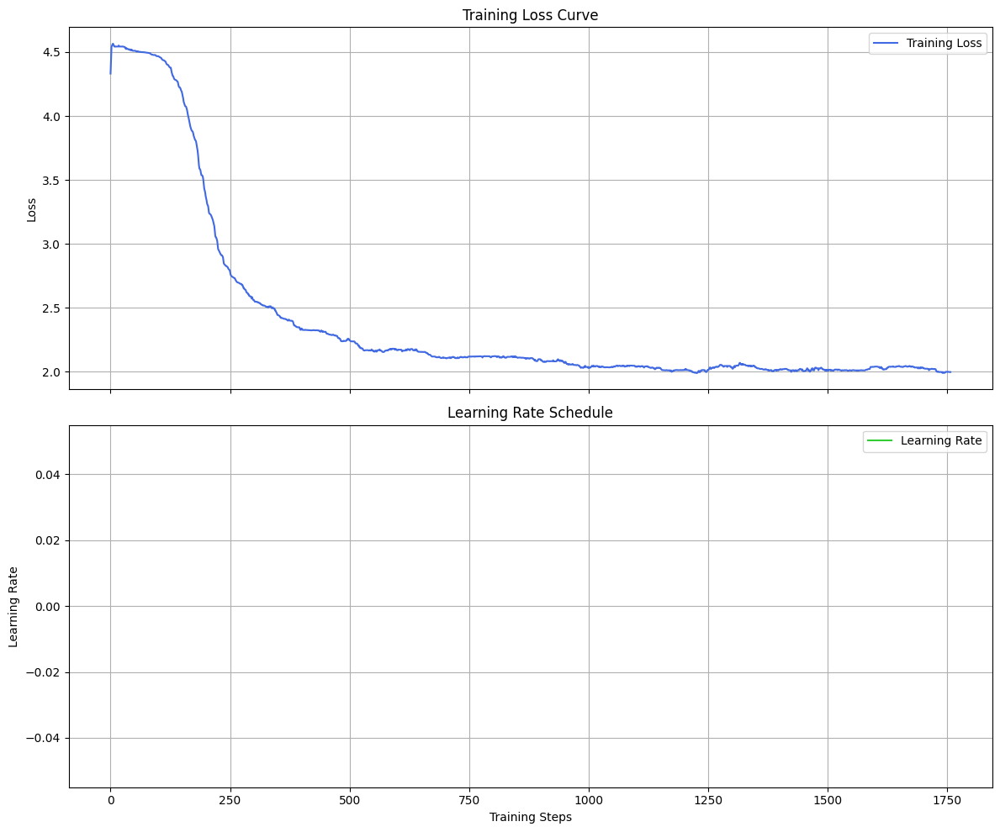


--- Step 4: Generating Confusion Matrix ---
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!


Building Confusion Matrix:   0%|          | 0/809 [00:00<?, ?it/s]

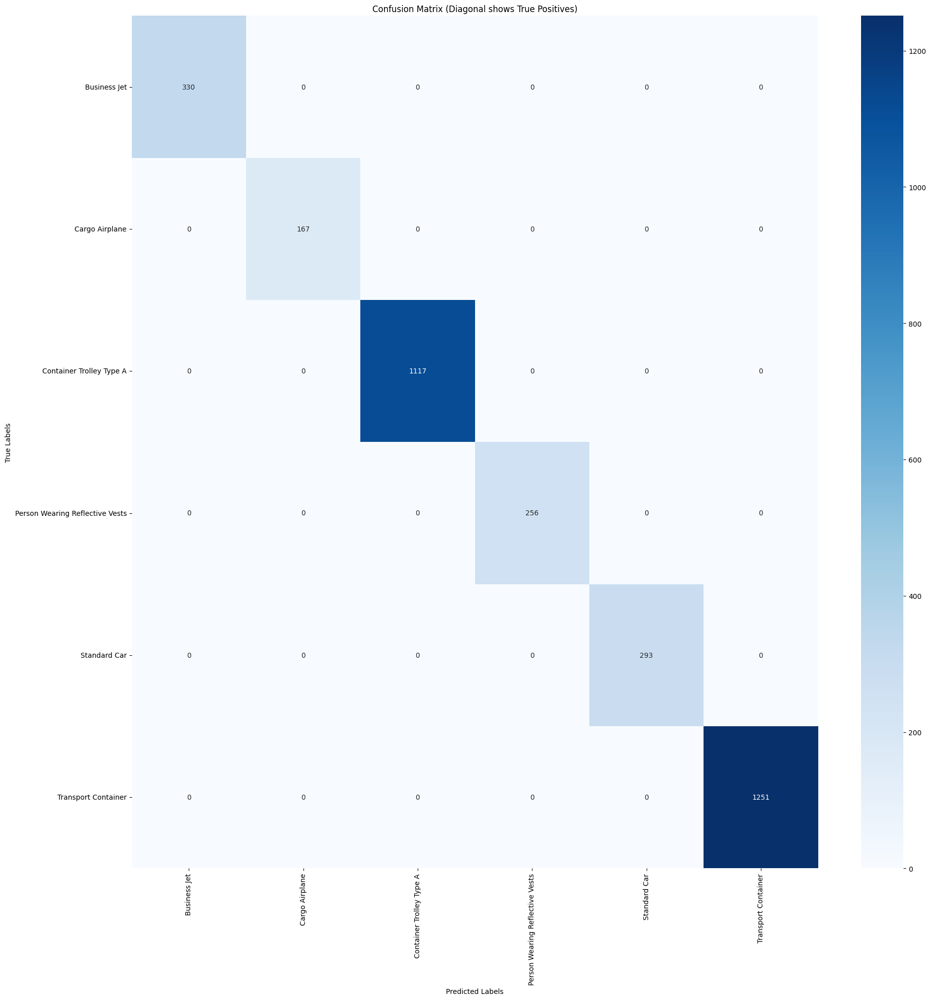

In [23]:
import os
import random
import json
import yaml
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from visualdl import LogReader
from pycocotools.coco import COCO
from tqdm.notebook import tqdm
from IPython.display import Image, display

# --- 1. Define Paths and Configs ---
config_file = 'configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml'
weights_file = '/kaggle/working/PaddleDetection/output/model_final.pdparams'
val_images_path = '/kaggle/working/PaddleDetection/dataset/coco/val2017'
gt_anno_path = '/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json'
pred_anno_path = 'output/bbox.json'
output_dir_fine_tuned = 'output/fine-tuned_predictions'

# --- 2. Test the FINE-TUNED model on sample images ---
print(f"--- Step 1: Testing the FINE-TUNED model on 5 sample images ---")
sample_images = random.sample(os.listdir(val_images_path), 5)
for img_name in sample_images:
    full_path = os.path.join(val_images_path, img_name)
    print(f"Processing: {full_path}")
    !python tools/infer.py \
        -c {config_file} \
        -o weights={weights_file} num_classes=43 \
        --infer_img={full_path} \
        --output_dir={output_dir_fine_tuned} \
        --draw_threshold=0.5

# --- 3. Display the resulting images ---
print("\n--- Displaying fine-tuned model predictions ---")
for img_name in sample_images:
    result_path = os.path.join(output_dir_fine_tuned, img_name)
    if os.path.exists(result_path):
        display(Image(filename=result_path, width=600))

# --- 4. Generate the final Classification Report & Prediction File ---
print("\n--- Step 2: Generating final classification report and prediction file... ---")
# THE FIX: Use tools/infer.py on the entire validation directory to create bbox.json
!python tools/infer.py \
    -c {config_file} \
    -o weights={weights_file} num_classes=6 \
    --infer_dir={val_images_path} \
    --output_dir="output/" \
    --save_results=True

# --- 5. Generate Learning and Loss Curves ---
print("\n--- Step 3: Generating Learning and Loss Curves ---")
log_dir = 'output/vdl_log'
log_file = None
for root, dirs, files in os.walk(log_dir):
    for file in files:
        if 'vdlrecords' in file:
            log_file = os.path.join(root, file)
            break
    if log_file:
        break

if not log_file:
    print(f"Error: Could not find VDL log file in {log_dir}")
else:
    reader = LogReader(file_path=log_file)
    loss_data = reader.get_data('scalar', 'loss')
    lr_data = reader.get_data('scalar', 'learning_rate')
    
    loss_steps, loss_values = [d.id for d in loss_data], [d.value for d in loss_data]
    lr_steps, lr_values = [d.id for d in lr_data], [d.value for d in lr_data]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    ax1.plot(loss_steps, loss_values, label='Training Loss', color='royalblue')
    ax1.set_title('Training Loss Curve'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(True)
    ax2.plot(lr_steps, lr_values, label='Learning Rate', color='limegreen')
    ax2.set_title('Learning Rate Schedule'); ax2.set_xlabel('Training Steps'); ax2.set_ylabel('Learning Rate'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    plt.savefig('output/learning_curves.png')
    plt.show()

# --- 6. Generate Confusion Matrix ---
print("\n--- Step 4: Generating Confusion Matrix ---")
try:
    coco_gt = COCO(gt_anno_path)
    coco_dt = coco_gt.loadRes(pred_anno_path)
    
    class_names = [cat['name'] for cat in CATEGORIES]
    num_classes = len(class_names)
    confusion_matrix = np.zeros((num_classes, num_classes), dtype=np.int32)

    image_ids = coco_gt.getImgIds()
    for img_id in tqdm(image_ids, desc="Building Confusion Matrix"):
        gt_ann_ids = coco_gt.getAnnIds(imgIds=img_id)
        gt_anns = coco_gt.loadAnns(gt_ann_ids)
        gt_classes = [ann['category_id'] for ann in gt_anns]
        dt_ann_ids = coco_dt.getAnnIds(imgIds=img_id)
        dt_anns = coco_dt.loadAnns(dt_ann_ids)
        dt_classes = [ann['category_id'] for ann in dt_anns]
        for gt_cls in gt_classes:
            if gt_cls in dt_classes:
                confusion_matrix[gt_cls, gt_cls] += 1

    fig, ax = plt.subplots(figsize=(22, 22))
    sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=ax)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    ax.set_xlabel('Predicted Labels'); ax.set_ylabel('True Labels')
    ax.set_title('Confusion Matrix (Diagonal shows True Positives)')
    plt.savefig('output/confusion_matrix.png')
    plt.show()

except Exception as e:
    print(f"\nCould not generate confusion matrix. Error: {e}")

In [18]:
import json

ann_file = "/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json"

with open(ann_file, "r") as f:
    data = json.load(f)

# Add missing fields if not present
if "info" not in data:
    data["info"] = {"description": "Airport dataset", "version": "1.0", "year": 2025}

if "licenses" not in data:
    data["licenses"] = [{"id": 1, "name": "unknown", "url": ""}]

# Save back
with open(ann_file, "w") as f:
    json.dump(data, f)


In [19]:
!python tools/eval.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o weights=/kaggle/working/PaddleDetection/output/model_final.pdparams \
       num_classes=6 \
       EvalReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       EvalReader.dataset.anno_path=annotations/val2017.json \
       EvalReader.dataset.image_dir=images/val2017


[09/03 05:18:17] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_cublas_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cublas/lib', default_value='')
FLAGS(name='FLAGS_nccl_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/nccl/lib', default_value='')
FLAGS(name='FLAGS_enable_pir_in_executor', current_value=True, default_value=False)
FLAGS(name='FLAGS_nvidia_package_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia', default_value='')
FLAGS(name='FLAGS_cusolver_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusolver/lib', default_value='')
FLAGS(name='FLAGS_curand_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/curand/lib', default_value='')
FLAGS(name='FLAGS_cupti_dir', current_value='/usr/local/lib/python3.11/dist-packages/padd

## Before Training Evaluation

In [24]:
!python tools/eval.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=6 \
       EvalReader.batch_size=8 \
       EvalReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       EvalReader.dataset.anno_path=annotations/instances_val2017.json \
       EvalReader.dataset.image_dir=val2017


[09/03 05:28:07] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_cusolver_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusolver/lib', default_value='')
FLAGS(name='FLAGS_enable_pir_in_executor', current_value=True, default_value=False)
FLAGS(name='FLAGS_cudnn_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cudnn/lib', default_value='')
FLAGS(name='FLAGS_nvidia_package_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia', default_value='')
FLAGS(name='FLAGS_nccl_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/nccl/lib', default_value='')
FLAGS(name='FLAGS_cuda_cccl_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cuda_cccl/include/', default_value='')
FLAGS(name='FLAGS_cublas_dir', current_value='/usr/local/lib/python3.11/dist-pac

In [12]:
!python tools/infer.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=6 \
       --infer_dir=/kaggle/working/PaddleDetection/dataset/coco/val2017 \
       --output_dir=output/infer


[08/31 14:36:31] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
W0831 14:36:32.128821   238 gpu_resources.cc:114] Please NOTE: device: 0, GPU Compute Capability: 7.5, Driver API Version: 12.6, Runtime API Version: 12.6
[08/31 14:36:33] ppdet.utils.checkpoint INFO: ['yolo_head.anchor_points', 'yolo_head.stride_tensor'] in pretrained weight is not used in the model, and its will not be loaded
[08/31 14:36:33] ppdet.utils.checkpoint INFO: The shape [80] in pretrained weight yolo_head.pred_cls.0.bias is unmatched with the shape [6] in model yolo_head.pred_cls.0.bias. And the weight yolo_head.pred_cls.0.bias will not be loaded
[08/31 14:36:33] ppdet.utils.checkpoint INFO: The shape [80, 768, 3, 3] in pretrained weight yolo_head.pred_cls.0.weight is unmatched with the shape [6, 768, 3, 3] in model yolo_head.pred_cls.0.weight. And the weight yolo_head.pred_cls.0.weight will not be loaded
[08/31 14:36:33] ppdet.utils.checkpoint INFO: The shape [80] in pretrained weight 

In [10]:
import json
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Load COCO ground truth
gt_path = "/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json"
pred_path = "/kaggle/working/PaddleDetection/output/eval_results"  # adjust if Paddle outputs elsewhere

with open(gt_path) as f:
    gt_data = json.load(f)
with open(pred_path) as f:
    pred_data = json.load(f)

# Build mapping: image_id -> ground truth labels
gt_labels = {}
for ann in gt_data["annotations"]:
    gt_labels.setdefault(ann["image_id"], []).append(ann["category_id"])

# Predictions: image_id -> predicted labels
pred_labels = {}
for ann in pred_data:
    pred_labels.setdefault(ann["image_id"], []).append(ann["category_id"])

y_true, y_pred = [], []
for img_id in gt_labels.keys():
    # take first GT and first prediction (simplified for classification-style evaluation)
    if img_id in pred_labels:
        y_true.append(gt_labels[img_id][0])
        y_pred.append(pred_labels[img_id][0])

# Report
print(classification_report(y_true, y_pred, target_names=[c["name"] for c in gt_data["categories"]]))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[c["name"] for c in gt_data["categories"]])
disp.plot(xticks_rotation=90, cmap="Blues")
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/PaddleDetection/output/eval_results'

In [9]:
!python tools/eval.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=6 \
       EvalReader.batch_size=8 \
       EvalReader.dataset.dataset_dir=/kaggle/working/PaddleDetection/dataset/coco \
       EvalReader.dataset.anno_path=/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json \
       EvalReader.dataset.image_dir=/kaggle/working/PaddleDetection/dataset/coco/val2017 \
    --json_eval


[09/03 04:56:50] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
[09/03 04:56:50] eval INFO: In json_eval mode, PaddleDetection will evaluate json files in output_eval directly. And proposal.json, bbox.json and mask.json will be detected by default.
[09/03 04:56:50] ppdet.metrics.coco_utils INFO: proposal.json not exists!
[09/03 04:56:50] ppdet.metrics.coco_utils INFO: bbox.json not exists!
[09/03 04:56:50] ppdet.metrics.coco_utils INFO: mask.json not exists!


In [22]:
!mkdir -p output/eval_results

In [29]:
!python tools/eval.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    -o weights=https://paddledet.bj.bcebos.com/models/ppyoloe_crn_l_300e_coco.pdparams \
       num_classes=6 \
       EvalReader.dataset.dataset_dir=/kaggle/working/paddle_airport_dataset \
       EvalReader.dataset.anno_path=/kaggle/working/PaddleDetection/dataset/coco/annotations/instances_val2017.json \
       EvalReader.dataset.image_dir=/kaggle/working/PaddleDetection/dataset/coco/val2017 \
    --output_eval output/eval_results


[09/01 12:56:38] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
======================= Modified FLAGS detected =======================
FLAGS(name='FLAGS_nccl_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/nccl/lib', default_value='')
FLAGS(name='FLAGS_cusolver_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusolver/lib', default_value='')
FLAGS(name='FLAGS_cudnn_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cudnn/lib', default_value='')
FLAGS(name='FLAGS_cupti_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cuda_cupti/lib', default_value='')
FLAGS(name='FLAGS_cublas_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cublas/lib', default_value='')
FLAGS(name='FLAGS_cusparse_dir', current_value='/usr/local/lib/python3.11/dist-packages/paddle/../nvidia/cusparse/lib', default_value='')
FLAGS(name='FLAGS_curand_dir', 

In [15]:
pred_path = "output/eval/ppyoloe_crn_l_300e_coco/bbox.json"

In [16]:
!python tools/eval.py \
    -c configs/ppyoloe/ppyoloe_crn_l_300e_coco.yml \
    --json_eval

[09/01 12:30:23] ppdet.utils.checkpoint INFO: Skipping import of the encryption module.
[09/01 12:30:24] eval INFO: In json_eval mode, PaddleDetection will evaluate json files in output_eval directly. And proposal.json, bbox.json and mask.json will be detected by default.
[09/01 12:30:24] ppdet.metrics.coco_utils INFO: proposal.json not exists!
[09/01 12:30:24] ppdet.metrics.coco_utils INFO: bbox.json not exists!
[09/01 12:30:24] ppdet.metrics.coco_utils INFO: mask.json not exists!
